<a href="https://colab.research.google.com/github/MarijaGijic/mri-streamlit-app/blob/main/Labeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import cv2
from matplotlib.widgets import RectangleSelector
from matplotlib.patches import Rectangle
import plotly.express as px

In [ ]:
images_path = '/content/drive/MyDrive/Slike_sa_maskama'
images_for_segmentation = []

image_files = [f for f in os.listdir(images_path) if f.endswith('.png')]
for image_file in image_files:
  img = Image.open(os.path.join(images_path, image_file))
  img_array = np.array(img)
  images_for_segmentation.append(img_array)

def prikazi_slike(images, rows = 4, cols = 5):
  fig, axes = plt.subplots(rows, cols, figsize=(15,15))
  axes = axes.flatten()

  for i, img in enumerate(images):
    axes[i].imshow(img, cmap='gray')
    axes[i].axis('off')

  plt.tight_layout()
  plt.show()




In [ ]:
# filtriranje
def filtriranje(images, methods=['non_local_means', 'gaussian', 'median'], method_args = None):
  all_filtered_images = []

  if method_args is None:
    method_args = {}

  for img in images:
    filtered_versions = {}

    for method in methods:
      args = method_args.get(method, {})

      if method == 'non_local_means':
        denoised_img = cv2.fastNlMeansDenoising(img, None, h=10, templateWindowSize=7, searchWindowSize=21)
      elif method == 'gaussian':
        kernel_size = args.get('kernel_size', (5, 5))
        std_dev_xy = args.get('std_dev_xy', 0)
        denoised_img = cv2.GaussianBlur(img, kernel_size, std_dev_xy)
      elif method == 'median':
        kernel = args.get('kernel', 5)
        denoised_img = cv2.medianBlur(img, kernel)
      else:
        raise ValueError("Nepoznati metod za filtriranje")

      filtered_versions[method] = denoised_img

    all_filtered_images.append(filtered_versions)

  return all_filtered_images

def display_filtered_images(filtered_versions, image_index):
  methods = list(filtered_versions.keys())
  num_methods = len(methods)

  plt.figure(figsize=(15,5))

  for i, method in enumerate(methods):
    img = filtered_versions[method]

    plt.subplot(1, num_methods, i+1)
    plt.imshow(img, cmap='gray')
    plt.title(f"Method: {method}")
    plt.axis('off')

  plt.show()

def display_img(img):
  plt.figure(figsize=(5, 5))
  plt.imshow(img, cmap='gray')
  plt.axis('off')
  plt.show()

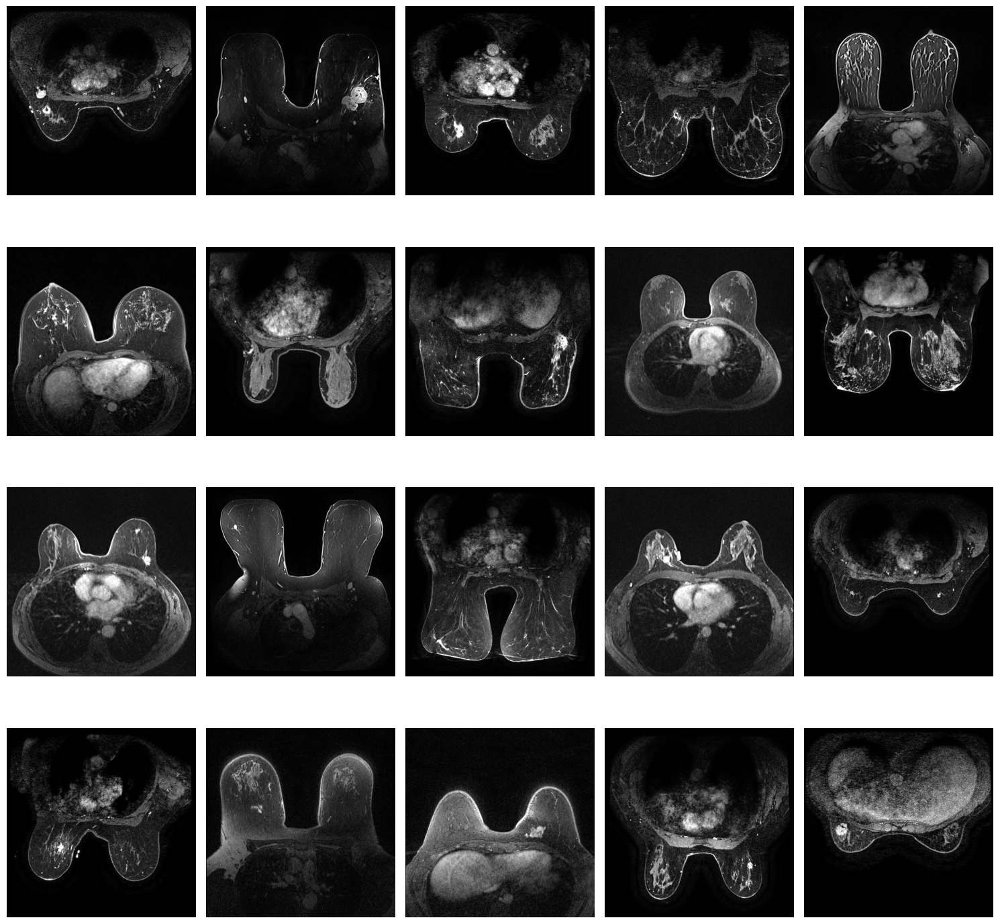

In [ ]:
prikazi_slike(images_for_segmentation)

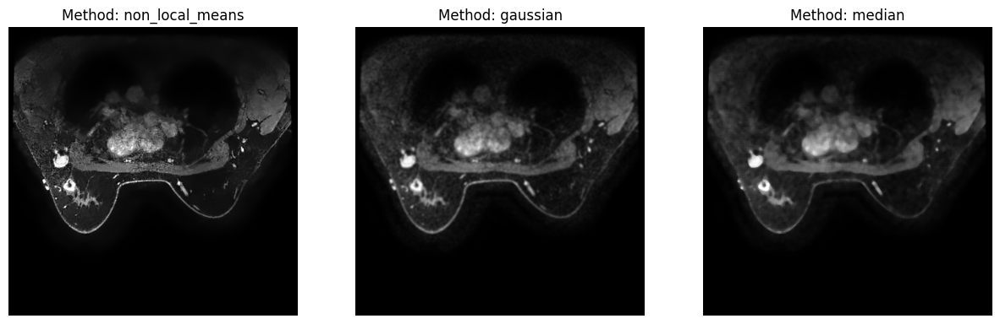

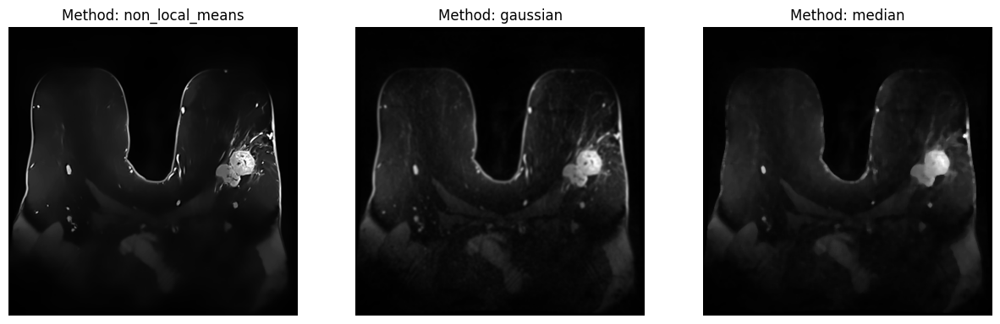

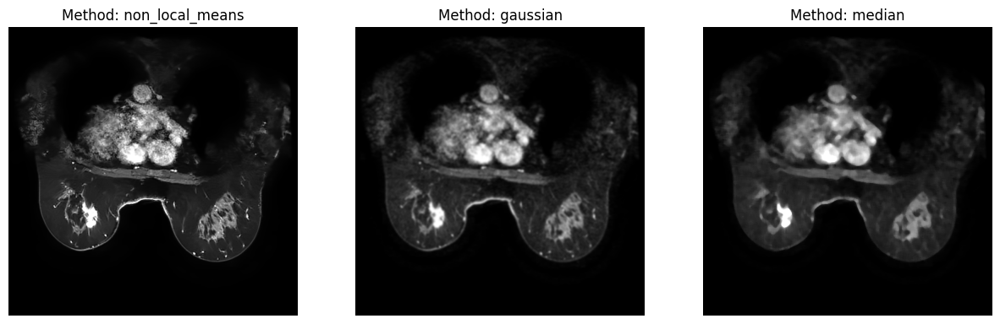

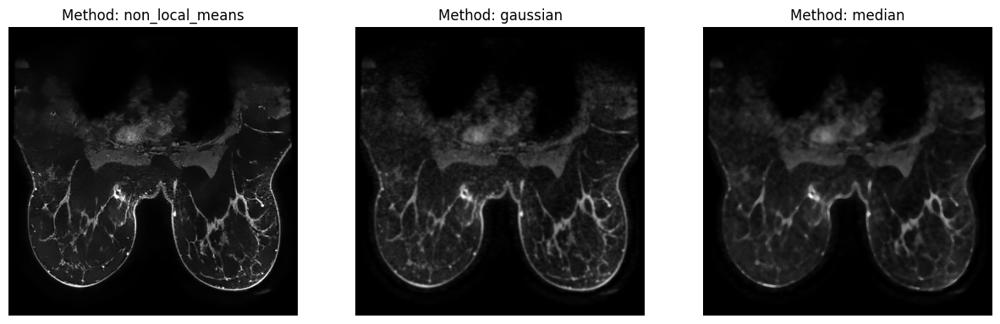

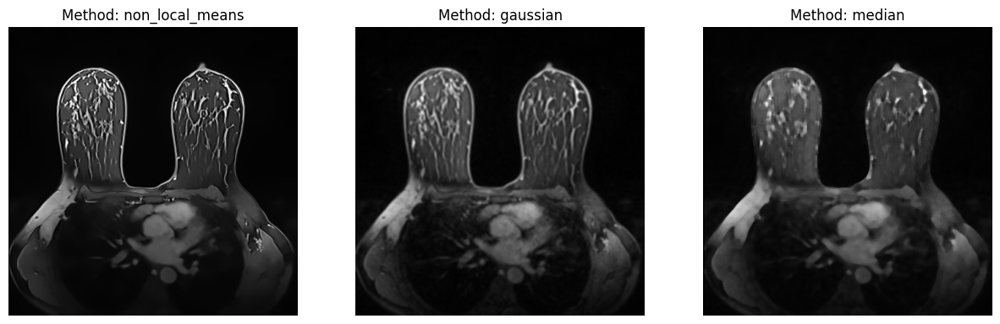

...

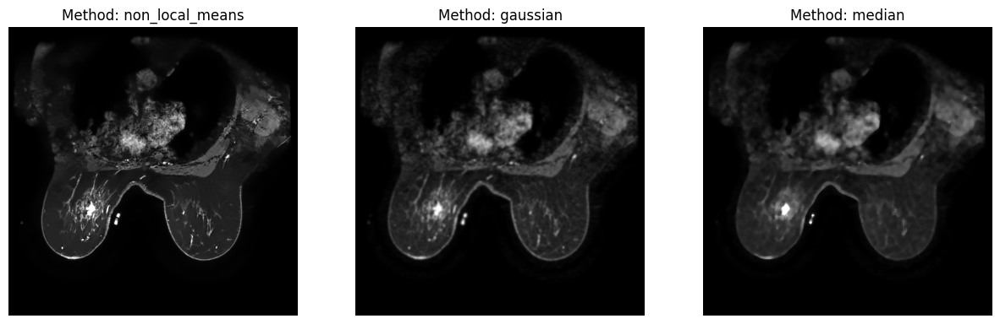

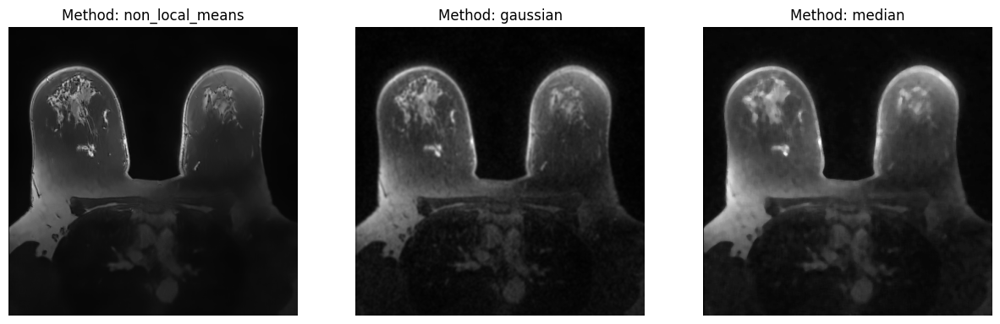

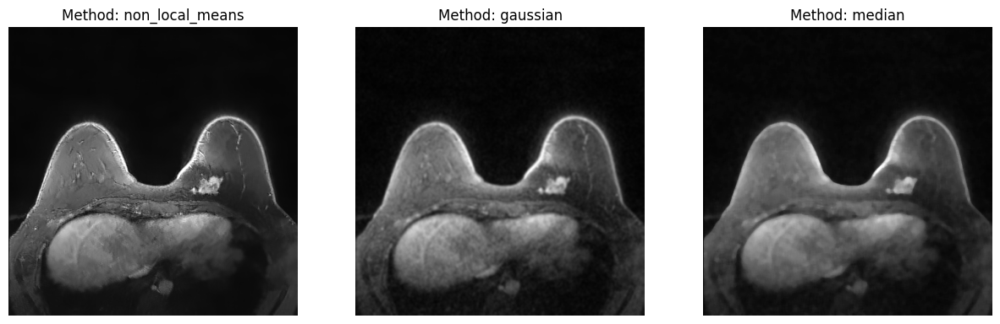

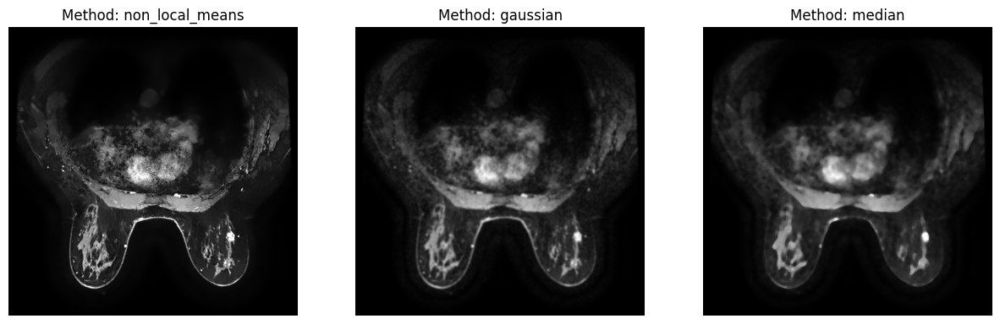

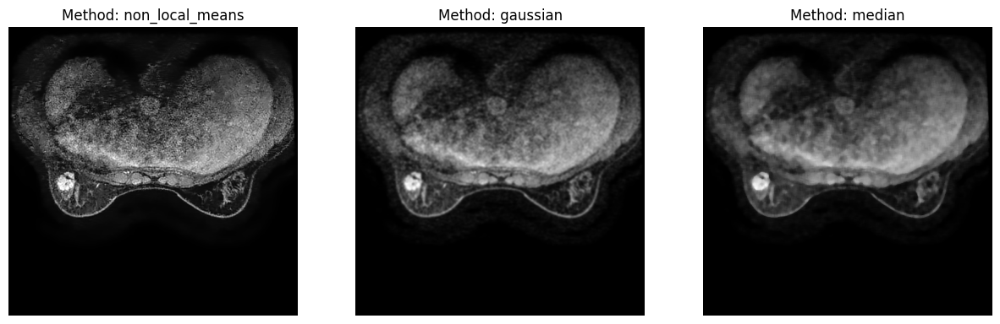

In [ ]:
# pre-defined method arguments
# cilj je maksimalno eliminisati Gibsov efekat
# kako bi se poboljsala maska
method_args ={
    'gaussian': {'kernel_size': (7, 7)},
    'median': {'kernel': 7}
}

all_filtered_images = filtriranje(images_for_segmentation, method_args = method_args)

for i, filtered_versions in enumerate(all_filtered_images):
    display_filtered_images(filtered_versions, i)

In [ ]:
def izaberi_filtriranu_sliku(filtered_versions, method):
  if method not in filtered_versions:
    raise ValueError(f"Method {method} not found in filtered versions.")
  return filtered_versions[method]

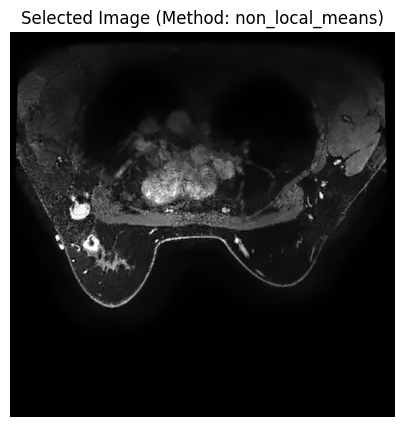

In [ ]:
# moze se primetiti da sa default parametrima ne resavamo problem sa zvonjavom oko dojki
izabran_metod = 'non_local_means'
selected_image = izaberi_filtriranu_sliku(all_filtered_images[0], izabran_metod)
plt.figure(figsize=(5, 5))
plt.imshow(selected_image, cmap='gray')
plt.title(f"Selected Image (Method: {izabran_metod})")
plt.axis('off')
plt.show()

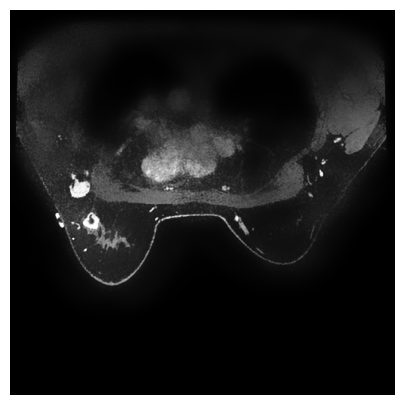

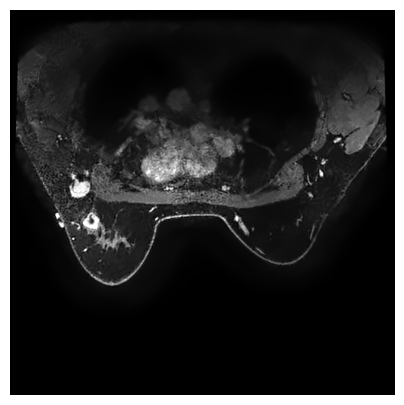

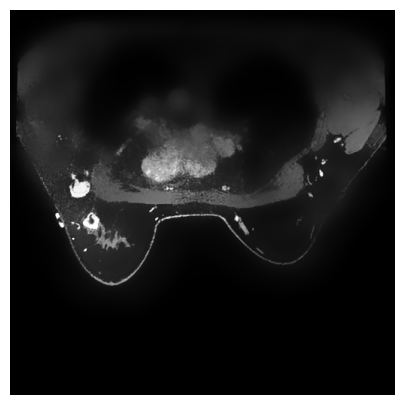

uint8


In [ ]:
# bilateral filtering
img1 = images_for_segmentation[0]
# filtriramo sliku koja je prethodno filtrirana 'non_local_means'
img2 = selected_image
bilateral_img = cv2.bilateralFilter(img1, d=30, sigmaColor=30, sigmaSpace=30)
bilateral_img1 = cv2.bilateralFilter(img2, d=30, sigmaColor=30, sigmaSpace=30)
fig = px.imshow(bilateral_img, color_continuous_scale='gray')
fig.show()
display_img(bilateral_img)
display_img(selected_image)
display_img(bilateral_img1)
print(bilateral_img.dtype)

In [ ]:
# funkcija za podesavanje kontransta vise slika odjednom
def podesavanje_kontrasta(images, method = 'clahe', **kwargs):
  enhanced_images = []

  for img in images:
    if method == 'clahe':
      clip_limit = kwargs.get('clip_limit', 2.0)
      tile_grid_size = kwargs.get('tile_grid_size', (8,8))
      clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
      enhanced_img = clahe.apply(img)

    elif method == 'ahe':
      kernel_size = kwargs.get('kernel_size', (8,8))
      img_padded = np.pad(img, ((kernel_size[0]//2, kernel_size[0]//2),
                                (kernel_size[1]//2, kernel_size[1]//2)),
                          mode='reflect')
      enhanced_img = np.zeros_like(img)
      for i in range(img.shape[0]):
        for j in range(img.shape[1]):
          local_region = img_padded[i:i+kernel_size[0], j:j+kernel_size[1]]
          enhanced_img[i,j] = cv2.equalizeHist(local_region)[kernel_size[0]//2, kernel_size[1]//2]

    elif method == 'gamma':
      gamma = kwargs.get('gamma', 1.0)
      inv_gamma = 1.0 / gamma
      table = np.array([(i / 255.0) ** inv_gamma * 255 for i in np.arange(0, 256)]).astype("uint8")
      enhanced_img = cv2.LUT(img, table)

    elif method == 'unsharp':
      sigma = kwargs.get('sigma', 1.0)
      strength = kwargs.get('strength', 1.5)
      blurred_img = cv2.GaussianBlur(img, (0, 0), sigma)
      enhanced_img = cv2.addWeighted(img, 1+strength, blurred_img, -strength, 0)

    else:
      raise ValueError("Nepostojeci metod")

    enhanced_images.append(enhanced_img)

  return enhanced_images

In [ ]:
def display_histograms(original_img, enhanced_img, method):
    # Compute the histograms for both images
    original_hist = cv2.calcHist([original_img], [0], None, [256], [0, 256])
    enhanced_hist = cv2.calcHist([enhanced_img], [0], None, [256], [0, 256])

    # Plot the histograms
    plt.figure(figsize=(12, 6))

    # Original image histogram
    plt.subplot(1, 2, 1)
    plt.plot(original_hist, color='blue')
    plt.title('Original Image Histogram')
    plt.xlim([0, 256])

    # Enhanced image histogram
    plt.subplot(1, 2, 2)
    plt.plot(enhanced_hist, color='green')
    plt.title(f'Enhanced Image Histogram ({method})')
    plt.xlim([0, 256])

    plt.show()

In [ ]:
# funckija za podesavanje kontrasta pojedinacnih slika
# prikazivanje histograma
def contrast_enhancement(img, method = 'clahe', show_histogram = True, **kwargs):

  if len(img.shape) != 2:
    raise ValueError("Mora da bude grayscale")
  if img.dtype != np.uint8:
    img = img.astype(np.uint8)

  if method == 'clahe':
      clip_limit = kwargs.get('clip_limit', 2.0)
      tile_grid_size = kwargs.get('tile_grid_size', (8,8))
      clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
      enhanced_img = clahe.apply(img)

  elif method == 'gamma':
      gamma = kwargs.get('gamma', 1.0)
      inv_gamma = 1.0 / gamma
      table = np.array([(i / 255.0) ** inv_gamma * 255 for i in np.arange(0, 256)]).astype("uint8")
      enhanced_img = cv2.LUT(img, table)

  elif method == 'unsharp':
      sigma = kwargs.get('sigma', 1.0)
      strength = kwargs.get('strength', 1.5)
      blurred_img = cv2.GaussianBlur(img, (0, 0), sigma)
      enhanced_img = cv2.addWeighted(img, 1+strength, blurred_img, -strength, 0)

  else:
      raise ValueError("Nepostojeci metod")

  if show_histogram:
    display_histograms(img, enhanced_img, method)

  return enhanced_img


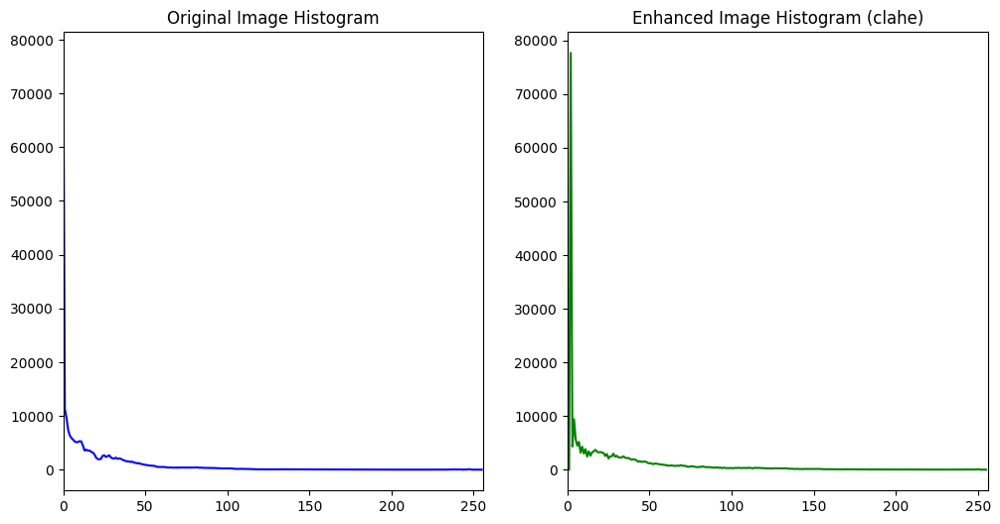

In [ ]:
enhanced_image = contrast_enhancement(bilateral_img1, method='clahe', clip_limit = 1.0)

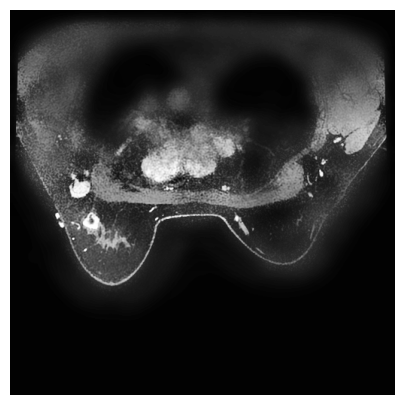

In [ ]:
display_img(enhanced_image)


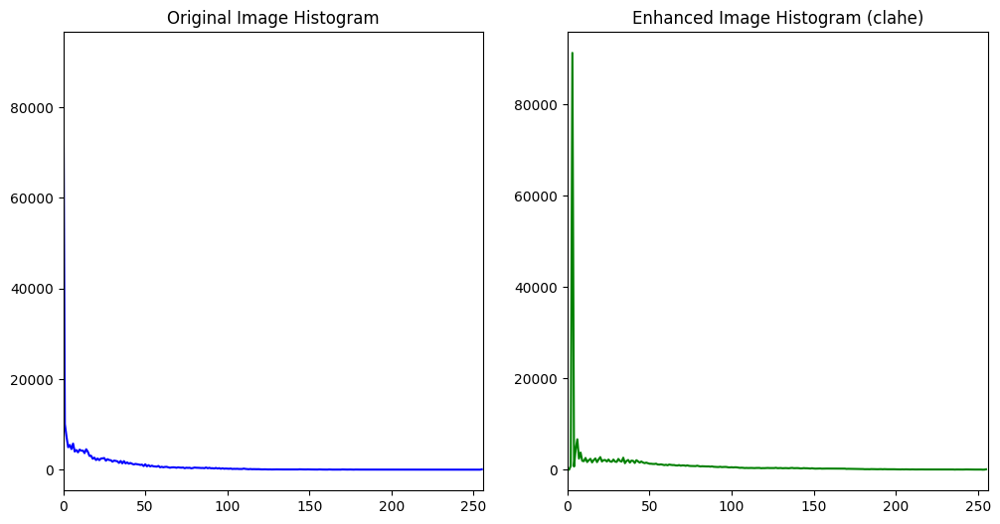

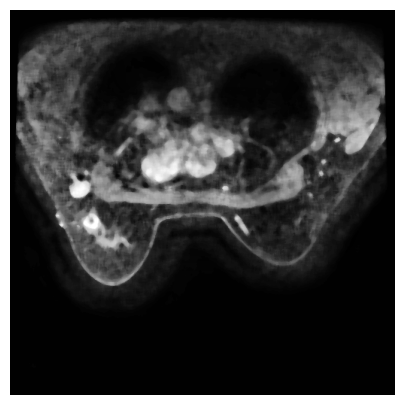

In [ ]:
izabran_metod = 'median'
selected_image_median = izaberi_filtriranu_sliku(all_filtered_images[0], izabran_metod)
enhanced_image = contrast_enhancement(selected_image_median, method='clahe')
display_img(enhanced_image)

In [ ]:
def deo_po_deo_linearna(img, p1, p2):
    lut1 = np.linspace(0,90,p1+1)
    lut2 = np.linspace(90, 200, p2+1)
    lut3 = np.linspace(200, 255, 258-(p1+1+p2+1))
    LUT = np.concatenate((lut1[:-1], lut2[:-1], lut3), axis = 0)
    img_out = LUT[img]
    img_out[img_out>255]=255
    img_out[img_out<0]=0
    return (img_out, LUT)

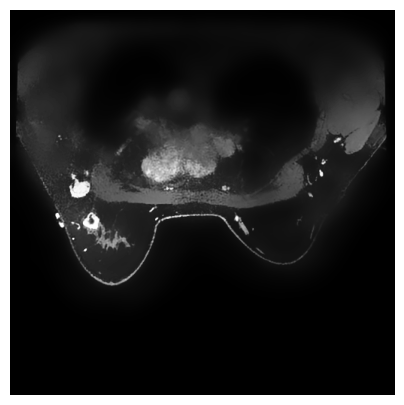

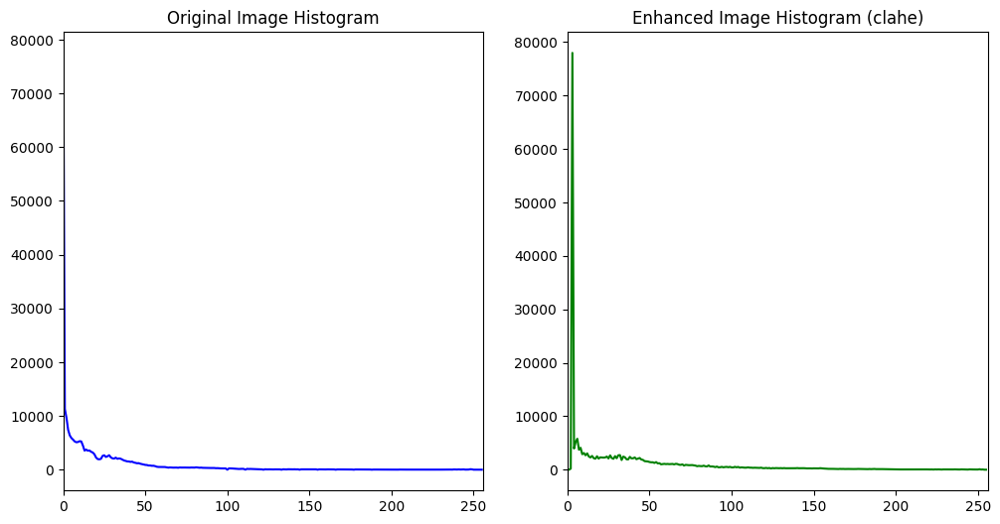

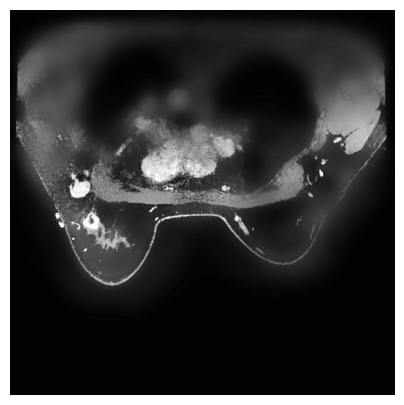

In [ ]:
import plotly.express as px

img_out, LUT = deo_po_deo_linearna(bilateral_img1, 90, 100)
img_out = img_out.astype(np.uint8)
fig = px.line(x=np.arange(256), y=LUT)
fig.update_layout(width=500,height=500)
fig.show()
display_img(img_out)
enhanced_img = contrast_enhancement(img_out, method = 'clahe')
display_img(enhanced_img)

In [ ]:
# maskiranje roi-a
roi_box = [150, 60, 170, 170]
def display_image_with_roi(img):
  global roi_box
  x, y, w, h = roi_box
  fig, ax = plt.subplots(figsize=(5, 5))

  ax.imshow(img, cmap='gray')
  rect = Rectangle((x, y), w, h, linewidth = 1, edgecolor='r', facecolor='none')
  ax.add_patch(rect)
  ax.axis('off')
  plt.show()

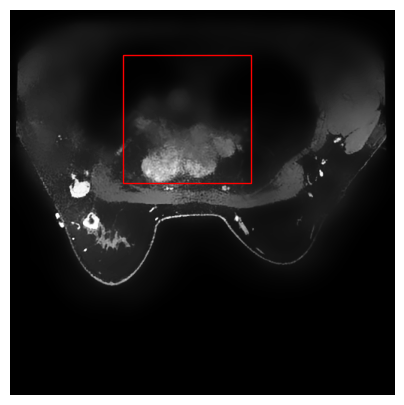

[150, 60, 170, 170]


In [ ]:
display_image_with_roi(img_out)
print(roi_box)

In [ ]:
def detect_heart_based_on_roi(img, threshold = 40):
    global roi_box
    result = []
    x, y, w, h = roi_box
    roi = img[y:y+h, x:x+w]

    avg_intensity = np.mean(roi)
    heart_visible = avg_intensity > threshold
    result.append(avg_intensity)
    result.append(heart_visible)

    return result, roi

In [ ]:
heart_visible, roi = detect_heart_based_on_roi(img_out)
print(heart_visible)

[41.17176470588235, True]


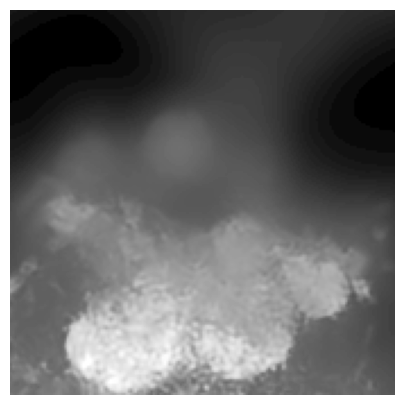

uint8


In [ ]:
kernel = np.ones((5, 5), np.uint8)
enhanced_roi = contrast_enhancement(roi, method = 'gamma', show_histogram=False, gamma = 2.5)
display_img(enhanced_roi)
print(enhanced_roi.dtype)

In [ ]:
from sklearn.cluster import KMeans
from skimage import morphology
def klasterizacija_roi(roi):
  enhanced_roi = contrast_enhancement(roi, method = 'gamma', show_histogram=False, gamma = 2.5)
  X = enhanced_roi.reshape(-1, 1)

  kmeans = KMeans(n_clusters = 2, n_init = 10, random_state = 0)
  kmeans.fit(X)

  cluster_centers = kmeans.cluster_centers_
  cluster_map = {0: 0, 1: 255}

  unique_labels = np.unique(kmeans.labels_)

  segmented_img =np.array([cluster_map[label] for label in kmeans.labels_])
  segmented_img = segmented_img.reshape(enhanced_roi.shape)

  #mask = (kmeans.labels_.reshape(enhanced_roi.shape) == '0').astype(np.uint8)


  return segmented_img, enhanced_roi

In [ ]:
segmented_img, enhanced_roi = klasterizacija_roi(roi)
print(segmented_img.dtype)
fig = px.imshow(segmented_img, color_continuous_scale = 'gray')
fig.show()

int64


In [ ]:
def maskiranje(roi_img_enhanced, img_original, roi_box, mask, **kwargs):

  mask = mask.astype(np.uint8)
  mask_close = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))
  #mask_filled = morphology.remove_small_holes(mask_close, area_threshold = 8000).astype('uint8')
  mask_erode = morphology.binary_erosion(mask_close, morphology.disk(8)).astype('uint8')
  mask_final = cv2.morphologyEx(mask_erode, cv2.MORPH_DILATE, np.ones((7, 7), np.uint8))
  #mask_final = cv2.bitwise_not(mask_final)
  masked_image = cv2.bitwise_and(enhanced_roi, enhanced_roi, mask=mask_final)

  mask_resized = np.zeros_like(img_original, dtype = np.uint8)
  x, y, w, h = roi_box
  mask_resized[y:y+h, x:x+w] = mask_final


  masked_img = img_original.copy()
  masked_img[mask_resized == 1] = 0

  return masked_img, mask_resized, mask_final

In [ ]:
masked_img, mask_resized, mask_final = maskiranje(enhanced_roi, img_out, roi_box, segmented_img)
masked_img = masked_img.astype('uint8')
fig = px.imshow(masked_img, color_continuous_scale='gray')
fig.show()
print(mask_final.dtype)


uint8


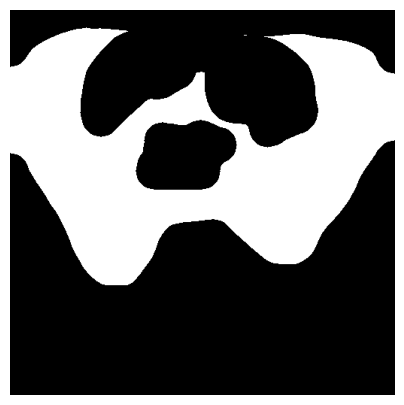

In [ ]:
#enhanced_img_for_clustering = contrast_enhancement(masked_img, method = 'clahe', show_histogram = False)
enhanced_img_for_clustering = masked_img
X = enhanced_img_for_clustering.reshape(-1, 1)
kmeans = KMeans(n_clusters=5, n_init=10, random_state=0)
kmeans.fit(X)

segmented_img = kmeans.cluster_centers_[kmeans.labels_]
segmented_img = segmented_img.reshape(enhanced_img_for_clustering.shape)

selected_cluster = 0
mask = (kmeans.labels_.reshape(enhanced_img_for_clustering.shape) == selected_cluster).astype(np.uint8)
mask_inv = cv2.bitwise_not(mask)
masked_image_ = cv2.bitwise_and(masked_img, masked_img, mask=mask)

#mask_erode = morphology.erosion(mask_inv, morphology.disk(1))
mask_closed = morphology.closing(mask_inv, morphology.disk(15))  # Zatvara otvorene regione
mask_final = morphology.erosion(mask_closed, morphology.disk(9))
#mask_filled = morphology.remove_small_holes(mask_erode, area_threshold=1)  # Uklanja male rupe

display_img(mask_final)

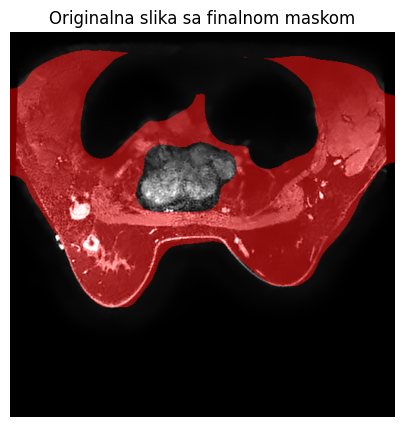

In [ ]:
mask_overlay = np.zeros((*mask_final.shape, 3), dtype=np.uint8)
mask_overlay[mask_final == 255] = [255, 0, 0]  # Red color for the mask

# Convert the original grayscale image to RGB
image_rgb = cv2.cvtColor(selected_image, cv2.COLOR_GRAY2RGB)

# Blend the mask overlay with the original image
blended_image = cv2.addWeighted(image_rgb, 1, mask_overlay, 0.5, 0)

# Display the final result
plt.figure(figsize=(5, 5))
plt.title('Originalna slika sa finalnom maskom')
plt.imshow(blended_image)
plt.axis('off')
plt.show()